# Best areas to stay at while visiting Istanbul

### Introduction

When planning to visit an unknown place we often have a hard time deciding which area would be the best to stay at for this short time. Some of the main concerns are price of the accommodation and safety. Additionally, because we come as tourists, we want to be close to tourist attractions and eateries.

The purpose of this notebook is to help to make that decision while travelling to Istanbul by classifying districts based on mentioned criteria.

Using Kmeans method districts are classified into 5 clusters organized from best to worst to stay at.
    
The classification, together with other statistics and location of attractions and restaurants, is shown on the map at the end of this notebook.

Calculations and assumptions while detemining criteria for classification are explaind in each section.

# Table of content

1. [Gather data](#get_data)<br>
    1.1 [Districts of Istanbul](#dist_data)<br>
    1.2 [Geojson data](#geoj_data)<br>
    1.3 [Rent prices](#rent_data)<br>
    1.4 [Crime data](#crime_data)<br>
    1.5 [Top attractions](#attractions_data)<br>
    1.6 [Top eating-out places](#food_data)<br>
2. [Classification](#classif)
3. [Maps](#map)<br>
    3.1.1 [Combined map](#comb_map)<br>
    3.1.2 [Clusters map](#clus_map)<br>
    3.1.3 [Population map](#population_map)<br>
    3.1.4 [Density map](#density_map)<br>
    3.1.5 [Rent map](#rents_map)<br>
    3.1.6 [Crime map](#crimes_map)

## 1. Gather data<a name='get_data'></a>

### 1.1 Districts of Istanbul<a name='dist_data'></a>

Download list of districts in Istanbul with simple statistics from wikipedia:
[https://en.wikipedia.org/wiki/List_of_districts_of_Istanbul](https://en.wikipedia.org/wiki/List_of_districts_of_Istanbul)

In [1]:
import pandas as pd
import numpy as np

In [2]:
# don't show warnings about chained assignments
pd.options.mode.chained_assignment = None  # default='warn'

Use pandas read_html to scrap the table.

In [3]:
url_districts = 'https://en.wikipedia.org/wiki/List_of_districts_of_Istanbul'
districts = pd.read_html(url_districts)
df_districts = districts[0].loc[:38]
df_districts = df_districts[['District', 'Population (2019)', 'Area (km²)', 'Density (per km²)']]
df_districts.head()

,District,Population (2019),Area (km²),Density (per km²)
0,Adalar,15238,11.05,1379
1,Arnavutköy,282488,450.35,627
2,Ataşehir,425094,25.23,16849
3,Avcılar,448882,42.01,10685
4,Bağcılar,745125,22.36,33324


#### District coordinates

Using geopy to get location coordinates for each district

In [4]:
from geopy.geocoders import Nominatim

In [5]:
geolocator = Nominatim(user_agent="foursquare_agent")

for idx, district in enumerate(df_districts['District']):
    location = geolocator.geocode(district + ', Istanbul, Turkey')
    df_districts.loc[idx, 'latitude'] = location.latitude
    df_districts.loc[idx, 'longitude'] = location.longitude

In [6]:
df_districts.head()

,District,Population (2019),Area (km²),Density (per km²),latitude,longitude
0,Adalar,15238,11.05,1379,40.876259,29.091027
1,Arnavutköy,282488,450.35,627,41.184182,28.740729
2,Ataşehir,425094,25.23,16849,40.984749,29.106720
3,Avcılar,448882,42.01,10685,40.980135,28.717547
4,Bağcılar,745125,22.36,33324,41.033899,28.857898


#### Unify district names

District names from different sources might differ in Turkish letters, therefore, to avoid any mismatch we replace all to latin alphabet.

In [7]:
from unidecode import unidecode

- replace district names for dataframe

In [8]:
for i, dist in enumerate(df_districts['District']):
    df_districts.loc[i, 'District'] = unidecode(dist)

In [9]:
df_districts[['District']].head()

,District
0,Adalar
1,Arnavutkoy
2,Atasehir
3,Avcilar
4,Bagcilar


### 1.2 Geojson data for districts<a name='geoj_data'></a>

The geospatial data of borders of Districts in Turkey were downloaded from [gadm.org](gadm.org)

In [10]:
import json

- import coordination data for districts borders

In [11]:
#with open("C:\\Users\\Pawel\\Documents\\Github\\projects\\Coursera_Capstone\\Istanbul\\data\\turkey_dist.json", 'r', encoding='utf-8') as f:
#    turkey_dist_geo = json.load(f)

- extract coordination data for districts of Istanbul

In [12]:
#istanbul_dist_geo_list = []
#dist_names = []
#for dist in turkey_dist_geo['features']:
#    if dist['properties']['NAME_1'] == 'Istanbul':
#        istanbul_dist_geo_list.append(dist)
#        dist_names.append(dist['properties']['NAME_2'])

#istanbul_dist_geo = {}
#istanbul_dist_geo['type'] = turkey_dist_geo['type']
#istanbul_dist_geo['features'] = istanbul_dist_geo_list

- Save json file with district borders for Istanbul

In [13]:
#with open("C:\\Users\\Pawel\\Documents\\Github\\projects\\Coursera_Capstone\\Istanbul\\data\\istanbul.json", "w", encoding='utf-8') as f:
#        json.dump(istanbul_dist_geo, f, ensure_ascii=False)

- turned out that Silivri and Üsküdar districts were both under Üsküdar district. Using https://geojson.io/ I separated two districts and save whole data as geojson file

#### Unify district names

District names from different sources might differ in Turkish letters, therefore, to avoid any mismatch we replace all to latin alphabet.

- replace names for geojson file

In [14]:
#open geojson file
with open("C:\\Users\\Pawel\\Documents\\Github\\projects\\Coursera_Capstone\\Istanbul\\data\\istanbul_map.geojson", "r", encoding='utf-8') as f:
    istanbul_dist_geo = json.load(f)

In [15]:
istanbul_dist_geo['features'][4]['properties']['NAME_2']

'Bağcılar'

In [16]:
# replace all district names
names = []
for i, dist in enumerate(istanbul_dist_geo['features']):
    dist_name = dist['properties']['NAME_2']
    istanbul_dist_geo['features'][i]['properties']['NAME_2'] = unidecode(dist_name)
    names.append(unidecode(dist_name))

In [17]:
istanbul_dist_geo['features'][4]['properties']['NAME_2']

'Bagcilar'

In [18]:
# save geojson file
with open("C:\\Users\\Pawel\\Documents\\Github\\projects\\Coursera_Capstone\\Istanbul\\data\\istanbul_map2.geojson", "w", encoding='utf-8') as f:
        json.dump(istanbul_dist_geo, f, ensure_ascii=False)

- check if district names match with the names obtained before

In [19]:
names == list(df_districts['District'])
filtered_list = [i for i, dist in enumerate(names) if dist not in list(df_districts['District'])]
filtered_list

[18]

One district name does not match

In [20]:
print(names[18])
print(df_districts.loc[18,'District'])

Eyup
Eyupsultan


\* *name of one of the districts differ slightly*

- change dataframe name to match that of geojson

In [21]:
with open("C:\\Users\\Pawel\\Documents\\Github\\projects\\Coursera_Capstone\\Istanbul\\data\\istanbul_map2.geojson", "r") as f:
    name = json.load(f)

In [22]:
df_districts.loc[filtered_list, 'District'] = name['features'][filtered_list[0]]['properties']['NAME_2']

## 1.3 Rent prices<a name="rent_data"></a>

I was unable to find any avaialable free API or data source for personal use for prices of short term accomodation. Instead, it is assumed here that prices of short time stay accomodation are correlated with rent prices. Because exact amount is not necessary but comparison between districts, this should be sufficient.

We webscrap rent prices from [https://www.realtygroup.com.tr/average-rent-price-in-istanbul-is-1486-tl/](https://www.realtygroup.com.tr/average-rent-price-in-istanbul-is-1486-tl/)

- use BeautifulSoup library to get average rent price per $m^{2}$ for each district

In [23]:
from bs4 import BeautifulSoup
import requests

In [24]:
# url for the website
url_rent = 'https://www.realtygroup.com.tr/average-rent-price-in-istanbul-is-1486-tl/'
html_content = requests.get(url_rent)
content = html_content.text
soup = BeautifulSoup(content, 'lxml')

# find table on the website
table = soup.find("table", attrs = {"width": "0"})

In [25]:
# get table headers
t_headers = []
for th in table.find_all("strong"):
    t_headers.append(th.text.replace("\n",' ').strip())

t_headers

['Payback Period (years)', 'Rent (TL/m2)', 'District']

In [26]:
# get data from table
table_data = []
for tr in table.tbody.find_all("tr"): # each row in tbody of table is tr
    t_row = {}
    for td, th in zip(tr.find_all("td"), t_headers): # each cell in row is td
        t_row[th] = td.text.replace('\n','').strip()
    table_data.append(t_row)
table_data = table_data[1:]

In [27]:
df_rent = pd.DataFrame(table_data)
df_rent.drop(['Payback Period (years)'], axis=1, inplace=True)
df_rent.head()

,Rent (TL/m2),District
0,18,Adalar
1,8,Arnavutköy
2,16,Ataşehir
3,12,Avcılar
4,12,Bağcılar


#### Unify district names

District names from different sources might differ in Turkish letters, therefore, to avoid any mismatch we replace all to latin alphabet.

- remove Turkish characters

In [28]:
for i, dist in enumerate(df_rent['District']):
    df_rent.loc[i, 'District'] = unidecode(dist)

In [29]:
df_rent.head()

,Rent (TL/m2),District
0,18,Adalar
1,8,Arnavutkoy
2,16,Atasehir
3,12,Avcilar
4,12,Bagcilar


- check if district names match those from before

In [30]:
filtered_list = [i for i, dist in enumerate(df_rent['District']) if dist not in list(df_districts['District'])]
filtered_list

[]

- add rent prices to districts dataframe

In [31]:
df_districts_rent = df_districts.join(df_rent.set_index('District'), on='District', how='left')
df_districts_rent.head()

,District,Population (2019),Area (km²),Density (per km²),latitude,longitude,Rent (TL/m2)
0,Adalar,15238,11.05,1379,40.876259,29.091027,18
1,Arnavutkoy,282488,450.35,627,41.184182,28.740729,8
2,Atasehir,425094,25.23,16849,40.984749,29.106720,16
3,Avcilar,448882,42.01,10685,40.980135,28.717547,12
4,Bagcilar,745125,22.36,33324,41.033899,28.857898,12


## 1.4 Crime data<a name='crime_data'></a>

Because some crimes are more serious than other the safety of the district will be determined based on The Crime Severity Index (https://www150.statcan.gc.ca/n1/pub/85-004-x/2009001/part-partie1-eng.htm). 

It is calculated by multiplying number of crimes commited by weight which determines seriousness of the type of the crime (more serious crimes have higher weight) and divided by the population number of the district.

$crime\ index = \frac{\Sigma \#cases \cdot weight}{population}$

The weights will be based on the weights given for Canada (https://www150.statcan.gc.ca/n1/pub/85-004-x/2009001/t001-eng.htm).

The only crime statistics for Istanbul I could find was from year 2003.<br>
*Ergun, N., & Yirmibeşoğlu, F. (2007). Distribution of Crime Rates in Different Districts in Istanbul. Turkish Studies, 8(3), 435–455. doi:10.1080/14683840701489324*

List of crime weights for Canada contains more types of crimes than what we got for Istanbul. Few of them could fit into one category for Istanbul data. Therefore, we will average those weights to use for our data.

- load data from pdf file

In [32]:
import tabula

In [33]:
# Read pdf into a list of DataFrame
pdf_path = "C:\\Users\\Pawel\\Documents\\Github\\projects\\Coursera_Capstone\\Istanbul\\data\\ergun2007.pdf"
dfs = tabula.read_pdf(pdf_path, pages='5,6')

In [34]:
dfs.head()

,Eminönü,27,244,110,91,513,346,1331,55635,"0,024"
0,Beyoğlu,21,497,236,183,2059,1096,4092,231900,"0,017"
1,Fatih,74,504,378,116,4377,699,6148,403508,"0,015"
2,Sişli,17,216,42,108,3107,284,3774,270674,"0,014"
3,Beşiktaş,7,99,37,79,2322,268,2812,190813,"0,015"
4,Üsküdar,16,223,196,49,2015,224,2723,495118,"0,005"


In [35]:
dfs.append(list(dfs.columns.values))
dfs.rename(columns={'Eminönü':'District',
                    '27':'Homocide', 
                    '244':'Attempted Homocide', 
                    '110':'Assault', 
                    '91':'Aggravated Assult',
                    '513':'Theft',
                    '346':'Pickpocketing_Snatching',
                    '1331':'Total crime 2003',
                    '55635':'Population 2000',
                    '0,024':'Crime %00'}, inplace=True)
dfs.head()           

,District,Homocide,Attempted Homocide,Assault,Aggravated Assult,Theft,Pickpocketing_Snatching,Total crime 2003,Population 2000,Crime %00
0,Beyoğlu,21,497,236,183,2059,1096,4092,231900,"0,017"
1,Fatih,74,504,378,116,4377,699,6148,403508,"0,015"
2,Sişli,17,216,42,108,3107,284,3774,270674,"0,014"
3,Beşiktaş,7,99,37,79,2322,268,2812,190813,"0,015"
4,Üsküdar,16,223,196,49,2015,224,2723,495118,"0,005"


In [36]:
dfs.tail()

,District,Homocide,Attempted Homocide,Assault,Aggravated Assult,Theft,Pickpocketing_Snatching,Total crime 2003,Population 2000,Crime %00
28,Sultanbeyli,7,95,124,8,524,22,780,175700,"0,004"
29,Avcılar,5,102,39,33,883,60,1122,233749,"0,005"
30,Tuzla,4,45,84,11,451,71,666,107883,"0,006"
31,Average,"14,4",165,76,49,"1361,8","179,5","1846,063",283925,"0,007"
32,TOTAL,462,5281,2437,1573,43578,5743,59074,9085599,"0,007"


In [37]:
# remove last 2 row
dfs.drop([31,32], inplace=True)

- check dtypes of constructed dataframe

In [38]:
dfs.dtypes

District                   object
Homocide                   object
Attempted Homocide          int64
Assault                     int64
Aggravated Assult           int64
Theft                      object
Pickpocketing_Snatching    object
Total crime 2003           object
Population 2000             int64
Crime %00                  object
dtype: object

\* some of the values in dataframe are of type object instead of int or float

- change object type to int in dataframe

In [39]:
cols = dfs.columns.drop('District')
dfs[cols] = dfs[cols].apply(pd.to_numeric, errors='coerce')

- get weights for crime types

In [40]:
url_crime_weights = 'https://www150.statcan.gc.ca/n1/pub/85-004-x/2009001/t001-eng.htm'
crime_weights = pd.read_html(url_crime_weights)
df_crime_weights = crime_weights[0][2:]
df_crime_weights.rename(columns={'Unnamed: 0': 'Offence'}, inplace=True)
df_crime_weights.reset_index(inplace=True, drop=True)
df_crime_weights

,Offence,Weight
0,Murder 1 st and 2 nd degree,7042
1,Manslaughter,1822
2,Attempted murder,1411
3,Sexual assault - level 3,1047
4,Discharging firearm with intent,988
5,Sexual assault - level 2,678
6,Robbery,583
7,Assault - level 3,405
8,Using firearm in commission of an offence,267
9,Sexual assault - level 1,211


Check data type in crime weights dataframe

In [41]:
df_crime_weights.dtypes

Offence    object
Weight     object
dtype: object

Change object to numeric in 'Weight' column

In [42]:
df_crime_weights['Weight'] = pd.to_numeric(df_crime_weights['Weight'])

#### calculate The Crime Severity Index for each district
- we assign crime types for Istanbul with weights as:
    - Homocide: Murder 1 st and 2 nd degree
    - Attempted Homocide: Attempted murder
    - Assault: average of Assault - level 1, Assault - level 2, Sexual assault - level 1
    - Aggravated Assult: average of Assault - level 3, Sexual assault - level 2, Sexual assault - level 3
    - Theft: average of Theft of a motor vehicle, Theft over \$5,000
    - Pickpocketing_Snatching: Theft under \$5,000

In [43]:
crime_idx = []
for i in range(dfs.shape[0]):
    
    homocide = (dfs.loc[i,'Homocide'] * df_crime_weights.loc[0,'Weight'])/dfs.loc[i,'Population 2000']
    
    attemp_homocide = (dfs.loc[i,'Attempted Homocide'] * df_crime_weights.loc[2,'Weight'])/dfs.loc[i,'Population 2000']
    
    assault = (dfs.loc[i,'Assault'] * df_crime_weights.loc[[23,16,9],'Weight'].mean())/dfs.loc[i,'Population 2000']
    
    agg_assault = (dfs.loc[i,'Aggravated Assult'] * df_crime_weights.loc[[7,5,3],'Weight'].mean())/dfs.loc[i,'Population 2000']
    
    theft = (dfs.loc[i,'Theft'] * df_crime_weights.loc[[15,12],'Weight'].mean())/dfs.loc[i,'Population 2000']
                                                   
    snatching = (dfs.loc[i,'Pickpocketing_Snatching'] * df_crime_weights.loc[21,'Weight'])/dfs.loc[i,'Population 2000']
    
    
    crime_idx.append(homocide+attemp_homocide+assault+agg_assault+theft+snatching)

- standardize values to 100 

In [44]:
crime_idx_ = list(np.round((crime_idx/max(crime_idx))*100))
crime_idx_100 = [int(i) for i in crime_idx_]

- crime idx for districts

In [45]:
df_crime_idx = dfs[['District']]
df_crime_idx['Crime index'] = crime_idx_100
df_crime_idx.head()

,District,Crime index
0,Beyoğlu,100
1,Fatih,84
2,Sişli,58
3,Beşiktaş,49
4,Üsküdar,26


#### Unify district names

District names from different sources might differ in Turkish letters, therefore, we replace all to latin alphabet.

In [46]:
for i, dist in enumerate(df_crime_idx['District']):
    df_crime_idx.loc[i, 'District'] = unidecode(dist)

In [47]:
filtered_list = [i for i, dist in enumerate(df_crime_idx['District']) if dist not in list(df_districts['District'])]
filtered_list

[]

- add crime data with rest

In [48]:
df_districts_rent_crime = df_districts_rent.join(df_crime_idx.set_index('District'), on='District', how='left')
df_districts_rent_crime.head()

,District,Population (2019),Area (km²),Density (per km²),latitude,longitude,Rent (TL/m2),Crime index
0,Adalar,15238,11.05,1379,40.876259,29.091027,18,30.0
1,Arnavutkoy,282488,450.35,627,41.184182,28.740729,8,NaN
2,Atasehir,425094,25.23,16849,40.984749,29.106720,16,NaN
3,Avcilar,448882,42.01,10685,40.980135,28.717547,12,24.0
4,Bagcilar,745125,22.36,33324,41.033899,28.857898,12,19.0


## 1.4 Top attractions<a name='attractions_data'></a>

Using Triposo API (free for personal use) find top 100 sightseeing places in Istanbul.
Get their name, score and coordinates

- use Triposo API to find sightseeing places

In [49]:
# get my creditentials
with open("C:\\Users\\Pawel\\Documents\\Github\\triposo_creds.json", 'r') as f:
    triposo_creds = json.load(f)
triposo_id = triposo_creds['ID']
triposo_token = triposo_creds['API_token']

In [50]:
# determine place and number of results
place = 'Istanbul'
count = '100'

In [51]:
url = ('https://www.triposo.com/api/20200405/poi.json?location_id={}' \
    + '&tag_labels=sightseeing' \
    + '&count={}' \
    + '&fields=name,score,tag_labels,coordinates' \
    + '&order_by=-score' \
    + '&account={}' \
    + '&token={}').format(place, count, triposo_id, triposo_token)

results = requests.get(url).json()

In [52]:
istanbul_attractions = pd.DataFrame(results['results'])
istanbul_attractions.head()

,name,coordinates,score,tag_labels,sightseeing_score
0,Topkapı Palace,"{'latitude': 41.0132564, 'longitude': 28.984852}",9.979321,"[museums, district, character, sightseeing, to...",9.979321
1,Sultan Ahmed Mosque,"{'latitude': 41.0052619, 'longitude': 28.9768725}",9.921485,"[district, character, sightseeing, poitype-Mos...",9.921485
2,Hagia Sophia,"{'latitude': 41.008337, 'longitude': 28.9792172}",9.878436,"[district, character, sightseeing, poitype-Chu...",9.878436
3,Dolmabahçe Palace,"{'latitude': 41.0391994360295, 'longitude': 28...",9.841813,"[district, sightseeing, poitype-Palace, topatt...",9.841813
4,İstanbul Archaeology Museums,"{'latitude': 41.011661893672574, 'longitude': ...",9.691590,"[museums, district, sightseeing, architectural...",9.691590


In [53]:
istanbul_attractions.drop(['tag_labels', 'sightseeing_score'], axis=1, inplace=True)
istanbul_attractions.head()

,name,coordinates,score
0,Topkapı Palace,"{'latitude': 41.0132564, 'longitude': 28.984852}",9.979321
1,Sultan Ahmed Mosque,"{'latitude': 41.0052619, 'longitude': 28.9768725}",9.921485
2,Hagia Sophia,"{'latitude': 41.008337, 'longitude': 28.9792172}",9.878436
3,Dolmabahçe Palace,"{'latitude': 41.0391994360295, 'longitude': 28...",9.841813
4,İstanbul Archaeology Museums,"{'latitude': 41.011661893672574, 'longitude': ...",9.691590


Extract coordination data

In [54]:
latitude = []
longitude = []
for coordinate in istanbul_attractions['coordinates']:
    latitude.append(coordinate['latitude'])
    longitude.append(coordinate['longitude'])

In [55]:
istanbul_attractions['Latitude'] = latitude
istanbul_attractions['Longitude'] = longitude
istanbul_attractions.drop(['coordinates'], axis=1, inplace=True)
istanbul_attractions.head()

,name,score,Latitude,Longitude
0,Topkapı Palace,9.979321,41.013256,28.984852
1,Sultan Ahmed Mosque,9.921485,41.005262,28.976872
2,Hagia Sophia,9.878436,41.008337,28.979217
3,Dolmabahçe Palace,9.841813,41.039199,28.999731
4,İstanbul Archaeology Museums,9.691590,41.011662,28.981299


- Change names of attractions to not contain Turkish characters

In [56]:
for i, name in enumerate(istanbul_attractions['name']):
    istanbul_attractions.loc[i, 'name'] = unidecode(name)

#### District-attraction score

Calculate district-attraction score, which is averaged distance from center of the district to each attraction place weighted by the inverse of the score the attraction obtained on Triposo.<br>
    - This way if one attraction is further away than another but it has much better score it will be more preferencial

\* real travel time would be more appropriate, however, I could not get free API or data for personal use providing such information.

- based on coordination data we determine distance between attraction and center of the districts and average it for each district
- then we wieght that distance by score that the place has
    - you would rather walk a bit more if the restaurant is much better

Define function to distance between two coordinate points

In [57]:
def distance(point1, point2):
    # uses the ‘haversine’ formula to calculate the great-circle distance between two points
    
    # input is a list with location in form point=[latitude, longitude]
        
    # volumetric mean radius of Earth [km]
    R = 6371
    
    point1_rad = np.array(point1)*np.pi/180
    point2_rad = np.array(point2)*np.pi/180
    d_lat = point1_rad[0]-point2_rad[0]
    d_lon = point1_rad[1]-point2_rad[1]
    
    a = np.sin((d_lat)/2)**2 + np.cos(point1_rad[0])*np.cos(point2_rad[0])*np.sin((d_lon)/2)**2
    c = 2*np.arctan2(np.sqrt(a), np.sqrt(1-a))
    d = R*c
    return d

In [58]:
df_districts_rent_crime.head()

,District,Population (2019),Area (km²),Density (per km²),latitude,longitude,Rent (TL/m2),Crime index
0,Adalar,15238,11.05,1379,40.876259,29.091027,18,30.0
1,Arnavutkoy,282488,450.35,627,41.184182,28.740729,8,NaN
2,Atasehir,425094,25.23,16849,40.984749,29.106720,16,NaN
3,Avcilar,448882,42.01,10685,40.980135,28.717547,12,24.0
4,Bagcilar,745125,22.36,33324,41.033899,28.857898,12,19.0


In [59]:
istanbul_attractions.head()

,name,score,Latitude,Longitude
0,Topkapi Palace,9.979321,41.013256,28.984852
1,Sultan Ahmed Mosque,9.921485,41.005262,28.976872
2,Hagia Sophia,9.878436,41.008337,28.979217
3,Dolmabahce Palace,9.841813,41.039199,28.999731
4,Istanbul Archaeology Museums,9.691590,41.011662,28.981299


Calculate district-attraction score

In [60]:
mean_distance_att = []
for dist, lat, lon in zip(df_districts_rent_crime['District'],df_districts_rent_crime['latitude'], df_districts_rent_crime['longitude']):
    position_dist = [lat, lon]
    distance_att = []
    for lat_att, lon_att, score_att in zip(istanbul_attractions['Latitude'], istanbul_attractions['Longitude'], istanbul_attractions['score']):
        position_att = [lat_att, lon_att]
        distance_att.append(distance(position_dist, position_att)*(1/score_att))
    
    mean_distance_att.append(sum(distance_att)/len(distance_att))

Add score to Istanbul dataframe

In [61]:
df_istanbul = df_districts_rent_crime
df_istanbul['District-attractions score'] = mean_distance_att
df_istanbul.head()

,District,Population (2019),Area (km²),Density (per km²),latitude,longitude,Rent (TL/m2),Crime index,District-attractions score
0,Adalar,15238,11.05,1379,40.876259,29.091027,18,30.0,2.297994
1,Arnavutkoy,282488,450.35,627,41.184182,28.740729,8,NaN,3.141996
2,Atasehir,425094,25.23,16849,40.984749,29.106720,16,NaN,1.390679
3,Avcilar,448882,42.01,10685,40.980135,28.717547,12,24.0,2.739199
4,Bagcilar,745125,22.36,33324,41.033899,28.857898,12,19.0,1.308855


## 1.5 Top eating-out places<a name='food_data'></a>

Using Triposo API (free for personal use) find top 100 eating-out places in Istanbul. Get their name, score and coordinates

In [62]:
url = ('https://www.triposo.com/api/20200405/poi.json?location_id={}' \
    + '&tag_labels=eatingout' \
    + '&count={}' \
    + '&fields=name,score,tag_labels,coordinates' \
    + '&order_by=-score' \
    + '&account={}' \
    + '&token={}').format(place, count, triposo_id, triposo_token)

results = requests.get(url).json()

In [63]:
istanbul_restaurants = pd.DataFrame(results['results'])
istanbul_restaurants.head()

,name,coordinates,score,tag_labels,eatingout_score
0,Mikla Restaurant,"{'latitude': 41.0310866, 'longitude': 28.9740165}",9.735005,"[lunch, dinner, cuisine, feature, district, ch...",9.735005
1,Beyti,"{'latitude': 40.97334205996415, 'longitude': 2...",9.634200,"[lunch, dinner, cuisine, district, eatingout, ...",9.634200
2,Babylonia Garden Terrace Restaurant,"{'latitude': 41.005844763358574, 'longitude': ...",9.501239,"[lunch, dinner, cuisine, feature, district, ea...",9.501239
3,Cozy Pub & Restaurant,"{'latitude': 41.0082598, 'longitude': 28.9743634}",8.994464,"[lunch, coffee, dinner, cuisine, feature, dist...",8.994464
4,Arch Bistro,"{'latitude': 41.0046271, 'longitude': 28.9712651}",7.328758,"[lunch, coffee, dinner, cuisine, district, bre...",7.328758


In [64]:
latitude = []
longitude = []
for coordinate in istanbul_restaurants['coordinates']:
    latitude.append(coordinate['latitude'])
    longitude.append(coordinate['longitude'])

In [65]:
istanbul_restaurants['Latitude'] = latitude
istanbul_restaurants['Longitude'] = longitude
istanbul_restaurants.drop(['coordinates', 'tag_labels', 'eatingout_score'], axis=1, inplace=True)
istanbul_restaurants.head()

,name,score,Latitude,Longitude
0,Mikla Restaurant,9.735005,41.031087,28.974017
1,Beyti,9.634200,40.973342,28.793959
2,Babylonia Garden Terrace Restaurant,9.501239,41.005845,28.980645
3,Cozy Pub & Restaurant,8.994464,41.008260,28.974363
4,Arch Bistro,7.328758,41.004627,28.971265


- Change names of attractions to not contain Turkish characters

In [66]:
for i, name in enumerate(istanbul_restaurants['name']):
    istanbul_restaurants.loc[i, 'name'] = unidecode(name)

#### District-food score

Calculate district-attraction score, which is averaged distance from center of the district to each attraction place weighted by the inverse of the score the attraction obtained on Triposo.<br>
    - This way if one attraction is furtheraway than another but it has much better score it will have better district-attraction score

\* real travel time would be more appropriate, however, I could not get free API or data for personal use providing such information.

- based on coordination data we determine distance between attraction and center of the districts and average it for each district
- then we wieght that distance by score that the place has
    - you would rather walk a bit more if the restaurant is much better

In [67]:
istanbul_restaurants.head()

,name,score,Latitude,Longitude
0,Mikla Restaurant,9.735005,41.031087,28.974017
1,Beyti,9.634200,40.973342,28.793959
2,Babylonia Garden Terrace Restaurant,9.501239,41.005845,28.980645
3,Cozy Pub & Restaurant,8.994464,41.008260,28.974363
4,Arch Bistro,7.328758,41.004627,28.971265


Calculate district-food score

In [68]:
mean_distance_food = []
for dist, lat, lon in zip(df_districts_rent_crime['District'],df_districts_rent_crime['latitude'], df_districts_rent_crime['longitude']):
    position_dist = [lat, lon]
    distance_food = []
    for lat_food, lon_food, score_food in zip(istanbul_restaurants['Latitude'], istanbul_restaurants['Longitude'], istanbul_restaurants['score']):
        position_food = [lat_food, lon_food]
        distance_food.append(distance(position_dist, position_food)*(1/score_food))
    
    mean_distance_food.append(sum(distance_food)/len(distance_food))

Add calculated scores to Istanbul dataframe

In [69]:
df_istanbul['District-food score'] = mean_distance_food
df_istanbul.head()

,District,Population (2019),Area (km²),Density (per km²),latitude,longitude,Rent (TL/m2),Crime index,District-attractions score,District-food score
0,Adalar,15238,11.05,1379,40.876259,29.091027,18,30.0,2.297994,3.044300
1,Arnavutkoy,282488,450.35,627,41.184182,28.740729,8,NaN,3.141996,4.438903
2,Atasehir,425094,25.23,16849,40.984749,29.106720,16,NaN,1.390679,1.882177
3,Avcilar,448882,42.01,10685,40.980135,28.717547,12,24.0,2.739199,3.689194
4,Bagcilar,745125,22.36,33324,41.033899,28.857898,12,19.0,1.308855,1.741132


## 2. Classification<a name='classif'><a/>

Implement Kmeans algorithm to classify districts of Istanbul into clusters based on the parameters described in introduction.

- the clustering will be based on rent, crime score, district-attraction score and district-food score

In [70]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

- before clustering make sure to change all values to numeric

In [71]:
cols = df_istanbul.drop('District',axis=1).columns
df_istanbul[cols] = df_istanbul[cols].apply(pd.to_numeric, errors='coerce')
df_istanbul.dtypes

District                       object
Population (2019)               int64
Area (km²)                    float64
Density (per km²)               int64
latitude                      float64
longitude                     float64
Rent (TL/m2)                    int64
Crime index                   float64
District-attractions score    float64
District-food score           float64
dtype: object

- Choose features for classification

In [72]:
features = df_istanbul[['Rent (TL/m2)', 'Crime index', 'District-attractions score', 'District-food score']]

- crime data has missing data for few districts
    - to deal with this we replace missing values with the mean value calculated from districts with existing crime data

In [73]:
# locate missing data
missing = ~np.isfinite(features)
# calculate mean for each column excluding nan rows
mu = np.nanmean(features, 0, keepdims=1)
# replace nan with mean
X_hat = np.where(missing, mu, features)

Normalize features. This is so that each feature is equaly important when classifying districts. 

In [74]:
cluster_dataset = StandardScaler().fit_transform(X_hat)

- determine number of k-clusters for classification using elbow method

In [75]:
Sum_of_squared_distances = []
for i in range(1,21):
    test = KMeans(i, init='k-means++', n_init=20, max_iter=500, random_state=4).fit(cluster_dataset)
    Sum_of_squared_distances.append(test.inertia_)

In [76]:
import matplotlib.pyplot as plt

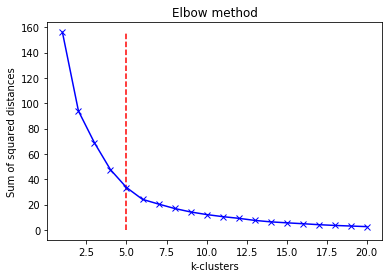

In [77]:
plt.plot(range(1,21), Sum_of_squared_distances, 'bx-')
plt.xlabel('k-clusters')
plt.ylabel('Sum of squared distances')
plt.title('Elbow method')
plt.vlines(5,0,Sum_of_squared_distances[0],'r','dashed')
#plt.savefig('figures/elbow.png')
plt.show()

\* from the elbow method we can tell that the optimal number of clusters is around 5-6, therefore, we will use k_clusters = 5

- Perform clustering

In [78]:
k_clusters = 5
labels = KMeans(k_clusters, init='k-means++', n_init=20, max_iter=500, random_state=4).fit_predict(cluster_dataset)

In [79]:
df_clust = pd.DataFrame(data=X_hat, columns=['Rent (TL/m2)','Crime index','District-attractions score','District-food score'])
df_clust['Cluster'] = labels
df_clust.head()

,Rent (TL/m2),Crime index,District-attractions score,District-food score,Cluster
0,18.0,30.000000,2.297994,3.044300,3
1,8.0,36.387097,3.141996,4.438903,0
2,16.0,36.387097,1.390679,1.882177,3
3,12.0,24.000000,2.739199,3.689194,0
4,12.0,19.000000,1.308855,1.741132,3


Add assigned clusters to Istanbul dataframe

In [80]:
df_istanbul_class = df_istanbul
df_istanbul_class['Class'] = labels
df_istanbul_class.head()

,District,Population (2019),Area (km²),Density (per km²),latitude,longitude,Rent (TL/m2),Crime index,District-attractions score,District-food score,Class
0,Adalar,15238,11.05,1379,40.876259,29.091027,18,30.0,2.297994,3.044300,3
1,Arnavutkoy,282488,450.35,627,41.184182,28.740729,8,NaN,3.141996,4.438903,0
2,Atasehir,425094,25.23,16849,40.984749,29.106720,16,NaN,1.390679,1.882177,3
3,Avcilar,448882,42.01,10685,40.980135,28.717547,12,24.0,2.739199,3.689194,0
4,Bagcilar,745125,22.36,33324,41.033899,28.857898,12,19.0,1.308855,1.741132,3


- check how districts were divided in clusters

In [81]:
mean_clus = df_clust.groupby(by=['Cluster']).mean()
mean_clus

,Rent (TL/m2),Crime index,District-attractions score,District-food score
Cluster,,,,
0,10.300000,31.293548,2.963151,4.097849
1,24.750000,36.596774,1.323172,1.845666
2,10.000000,34.666667,6.331155,8.870088
3,14.473684,30.303905,1.244146,1.665595
4,18.333333,93.333333,1.589601,2.071630


- Determine from best to worst how good districts in each cluster are to stay at. This is done by rating each feature based on mean values of the districts in that cluster.

In [82]:
scores = pd.DataFrame(columns=mean_clus.columns)
for column in mean_clus.columns:
    ratings = mean_clus.sort_values(by=column).reset_index()
    for cluster in mean_clus.index:
        scores.loc[cluster,column] = ratings[ratings['Cluster']==cluster].index[0]

In [83]:
scores['sum'] = scores.sum(axis=1)
scores.sort_values(by='sum', inplace=True)

In [84]:
scores.reset_index(inplace=True)

Rating each cluster got in each category, sorted from best to worst

In [85]:
scores.rename(columns={'index': 'Cluster'})

,Cluster,Rent (TL/m2),Crime index,District-attractions score,District-food score,sum
0,3,2,0,0,0,2.0
1,0,1,1,3,3,8.0
2,1,4,3,1,1,9.0
3,2,0,2,4,4,10.0
4,4,3,4,2,2,11.0


The lower the value in each feature the better district is to stay (low rent, low crime, close to places). As can be seen in table above best to stay at are districts in cluster 3.
- change cluster numbers according to their score

In [86]:
df_clust.replace({'Cluster': {0:1, 1:2, 2:3, 3:0}}, inplace=True)

In [87]:
df_clust.groupby(by='Cluster').mean()

,Rent (TL/m2),Crime index,District-attractions score,District-food score
Cluster,,,,
0,14.473684,30.303905,1.244146,1.665595
1,10.300000,31.293548,2.963151,4.097849
2,24.750000,36.596774,1.323172,1.845666
3,10.000000,34.666667,6.331155,8.870088
4,18.333333,93.333333,1.589601,2.071630


Show how many districts there is in each cluster

In [88]:
df_clust.groupby(by='Cluster').count()

,Rent (TL/m2),Crime index,District-attractions score,District-food score
Cluster,,,,
0,19,19,19,19
1,10,10,10,10
2,4,4,4,4
3,3,3,3,3
4,3,3,3,3


Replace cluster numbers in Istanbul Dataframe according to their rating

In [89]:
df_istanbul_class.replace({'Class': {0:1, 1:2, 2:3, 3:0}}, inplace=True)
df_istanbul_class.head()

,District,Population (2019),Area (km²),Density (per km²),latitude,longitude,Rent (TL/m2),Crime index,District-attractions score,District-food score,Class
0,Adalar,15238,11.05,1379,40.876259,29.091027,18,30.0,2.297994,3.044300,0
1,Arnavutkoy,282488,450.35,627,41.184182,28.740729,8,NaN,3.141996,4.438903,1
2,Atasehir,425094,25.23,16849,40.984749,29.106720,16,NaN,1.390679,1.882177,0
3,Avcilar,448882,42.01,10685,40.980135,28.717547,12,24.0,2.739199,3.689194,1
4,Bagcilar,745125,22.36,33324,41.033899,28.857898,12,19.0,1.308855,1.741132,0


## Few statistics

Visualize simple statistics for obtained clusters using boxplots

In [90]:
import seaborn as sns

In [91]:
cluster_colors = ['#1F553E', '#ADCF6F', '#FFF075', '#CF756F', '#930000']

my_pal = {i: color for i, color in enumerate(cluster_colors)}

- Rent statistics

[Text(0.5, 0, 'Cluster')]

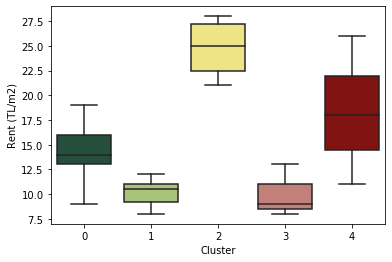

In [92]:
sns.boxplot(x='Cluster', y='Rent (TL/m2)', data=df_clust, palette=my_pal).set(xlabel='Cluster')
#plt.savefig('figures/rent.png')

- Crime statistics

[Text(0.5, 0, 'Cluster')]

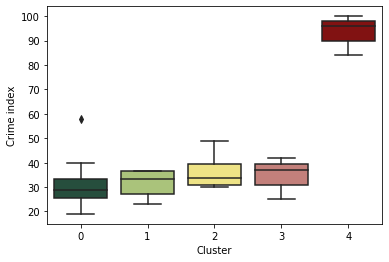

In [93]:
sns.boxplot(x='Cluster', y='Crime index', data=df_clust, palette=my_pal).set(xlabel='Cluster')
#plt.savefig('figures/crime.png')

- Attractions statistics

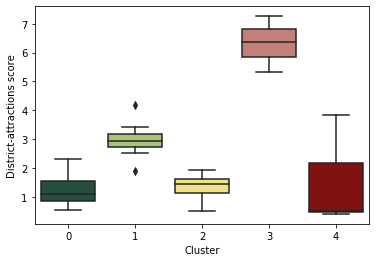

In [94]:
sns.boxplot(x='Cluster', y='District-attractions score', data=df_clust, palette=my_pal).set(xlabel='Cluster')
plt.savefig('figures/attr.png')

- Eateries statistics

[Text(0.5, 0, 'Cluster')]

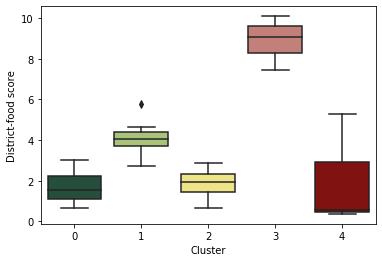

In [95]:
sns.boxplot(x='Cluster', y='District-food score', data=df_clust, palette=my_pal).set(xlabel='Cluster')
#plt.savefig('figures/food.png')

## 3. Map<a name='map'></a>

Create interactive map showing:<pre>
    a. classification of districts
    b. population of districts
    c. population density of districts
    d. average rent prices for districts
    e. crime scores for districts
    f. mark top 100 attractions
    g. mark top 100 eating-out places

Import libraries

In [96]:
import folium
import branca
from folium import plugins
from branca.element import Template, MacroElement

- define function to create a plain map

In [97]:
def plain_map():
    map = folium.Map(
        [df_istanbul_class['latitude'].median()+0.1, df_istanbul_class['longitude'].median()],
        zoom_start=9,
        tiles=None
    )
    
    base_map = folium.FeatureGroup(name='Basemap', overlay=True, control=False)
    folium.TileLayer(tiles='OpenStreetMap').add_to(base_map)
    base_map.add_to(map)
    
    # geojson file
    with open("C:\\Users\\Pawel\\Documents\\Github\\projects\\Coursera_Capstone\\Istanbul\\data\\istanbul_map2.geojson", "r", encoding='utf-8') as f:
        istanbul_geo = json.load(f)
        
    return map, istanbul_geo

- define function to create empty layer

In [98]:
def empty_layer():
    style_function = lambda x: {'color': '#000000',
                                'opacity': 0.3,
                                'weight': 2,
                                'fillOpacity': 0
                               }

    highlight_function = lambda x: {'fillColor': '#000000',
                                    'fillOpacity': 0.2}

    empty_layer = folium.FeatureGroup(name='Empty', overlay=False)

    folium.GeoJson(
                istanbul_geo,
                style_function=style_function,
                tooltip=folium.features.GeoJsonTooltip(
                    fields=['NAME_2'],
                    aliases=['District:'],
                    style=('background-color: grey; color: white;')
                    ),
                highlight_function=highlight_function
            ).add_to(empty_layer)

    return empty_layer

- define function to make layer with district statistics

In [99]:
def make_map_layer(layer_title, layer_attribute, colorscale, name):
    # layer_attribute: str, column name of the attribute from dataframe
    # layer_title: str, title of the layer appearing in layer control on the map
    # colorscale: branca colorscale for the geojson style_function
    # name: str, name for the popup
    
    # add layer attribute to geojson
    for i in range(df_istanbul_class.shape[0]):
        istanbul_geo['features'][i]['properties'][layer_title] = float(df_istanbul_class[df_istanbul_class['District']==istanbul_geo['features'][i]['properties']['NAME_2']][layer_attribute].values)

    # create style function for colors
    style_function = lambda x: {'fillColor': '#000000' if np.isnan(df_istanbul_class[df_istanbul_class['District']==x['properties']['NAME_2']][layer_attribute].values)
                            else colorscale((df_istanbul[df_istanbul['District']==x['properties']['NAME_2']][layer_attribute].values)),
                                'fillOpacity': 0 if np.isnan(df_istanbul_class[df_istanbul_class['District']==x['properties']['NAME_2']][layer_attribute].values)
                                            else 0.7,
                                'color': '#000000',
                                'opacity': 0.5,
                                'weight': 2
                               }

    # highlight function
    highlight_function = lambda x: {'fillColor': '#00FF00'}

    # create feature group
    layer = folium.FeatureGroup(name=name, overlay=False)

    # geojson layer
    cl=folium.GeoJson(
                istanbul_geo,
                style_function=style_function,
                tooltip=folium.features.GeoJsonTooltip(
                    fields=['NAME_2', layer_title],
                    aliases=['District:', layer_title+':'],
                    style=('background-color: grey; color: white;')
                    ),
                highlight_function=highlight_function
            ).add_to(layer)

    return layer

- Define function to add markers to the map

In [100]:
def make_markers(layer_name, Dframe, icon_color, clusters=True):
    layer = folium.FeatureGroup(name=layer_name, overlay=True, show=False)
    
    if clusters == True:
        cluster = plugins.MarkerCluster().add_to(layer)
    
    for latitude, longitude, name, score in zip(Dframe['Latitude'],
                                                Dframe['Longitude'],
                                                Dframe['name'], 
                                                Dframe['score']):
        text = folium.Html('<b>{}</b><br>({}/10)'.format(name, round(score,2)), script=True)
        popup = folium.Popup(text)
        mark = folium.Marker(
            [latitude, longitude],
            popup= popup,
            icon= folium.Icon(color=icon_color, icon='glyphicon-map-marker')
        )
        if clusters == True:
            mark.add_to(cluster)
        else:
            mark.add_to(layer)                

    return layer

- Define function to add circle markers to the map

In [101]:
def make_CircleMarkers(layer_name, Dframe, mark_color, radius, width, clusters=True):
    layer = folium.FeatureGroup(name=layer_name, overlay=True, show=False)
    
    if clusters == True:
        cluster = plugins.MarkerCluster().add_to(layer)
    
    for latitude, longitude, name, score in zip(Dframe['Latitude'],
                                                Dframe['Longitude'],
                                                Dframe['name'], 
                                                Dframe['score']):
        text = folium.Html('<b>{}</b><br>({}/10)'.format(name, round(score,2)), script=True)
        popup = folium.Popup(text)
        mark = folium.CircleMarker(
            [latitude, longitude],
            popup= popup,
            radius=radius,
            color='white',
            weight=width,
            fill_color=mark_color,
            fill_opacity=1
        )
        if clusters == True:
            mark.add_to(cluster)
        else:
            mark.add_to(layer)                

    return layer

- create color schemes for layers

In [102]:
# column names for maps
columns_df = df_istanbul_class.columns[[1,3,6,7,10]]
columns_df

Index(['Population (2019)', 'Density (per km²)', 'Rent (TL/m2)', 'Crime index',
       'Class'],
      dtype='object')

In [103]:
# color schemes for different layers
colors = [['#CCD7FF', '#9788FF', '#A248FA', '#D50DF1', '#CD06AD', '#A8025E', '#800022'],
          ['#DEEDCF', '#99D492', '#56B870', '#1D9A6C', '#16837A', '#0F596B', '#0A2F51'],
          ['#DFCCFF', '#E888FF', '#FF44E9', '#FF007C', '#D50028', '#AA0700', '#802C00'],
          ['#DAFAF1', '#ACE9F0', '#7FB4E5', '#5568D7', '#5444B6', '#5D3593', '#5A2670']]

names = ['Population (2019)','Density (per km2)','Rent (TL/m2)', 'Crime index', 'Cluster']

# create linear colormaps
colorscales=[]
for i in range(len(names)-1):
    colorscale = branca.colormap.LinearColormap(
                                colors=colors[i]
                                ).scale(0, df_istanbul[columns_df[i]].max())
    colorscales.append(colorscale)

# create a step colormap
colorscales.append(branca.colormap.LinearColormap(colors=cluster_colors, vmin=-0.5, vmax=4.5).to_step(n=5))

### 3.1 Show maps <a name='show_map'></a>

### 3.1.1 Combined Map <a name='comb_map'></a>

Interactive map containing all created layers for different features and statistics obtained from gathered data

Create a base map

In [104]:
istanbul_map, istanbul_geo = plain_map()

Add layers

In [105]:
# empty layer
emp_layer = empty_layer()
emp_layer.add_to(istanbul_map)

# cluster layer
cluster_layer = make_map_layer(names[-1], columns_df[-1], colorscales[-1], 'Clusters')
cluster_layer.add_to(istanbul_map)

# population layer
pop_map = make_map_layer(names[0], columns_df[0], colorscales[0], 'Population')
pop_map.add_to(istanbul_map)

# density layer
dens_layer = make_map_layer(names[1], columns_df[1], colorscales[1], 'Density')
dens_layer.add_to(istanbul_map)

# rent layer
rent_layer = make_map_layer(names[2], columns_df[2], colorscales[2], 'Rent')
rent_layer.add_to(istanbul_map)

# crime layer
crime_layer = make_map_layer(names[3], columns_df[3], colorscales[3], 'Crime')
crime_layer.add_to(istanbul_map)

Add markers

In [106]:
# add attraction markers
attr_layer = make_markers('Attractions', istanbul_attractions, 'red')
attr_layer.add_to(istanbul_map)

# add food markers
food_layer = make_markers('Food', istanbul_restaurants, 'blue')
food_layer.add_to(istanbul_map)

Show map

In [107]:
folium.LayerControl(collapsed=False).add_to(istanbul_map)

istanbul_map

In [108]:
istanbul_map.save('figures/istanbul_map.html')

## Separate maps (with legends)

Because in the map above I was not able to add different legends for each layer (could not find solution to that). Here separate maps are created with corresponding legends for each feature/statistics

- legend for maps (besides clusters map)

In [109]:
def legend_layer(title, name, cmap):
    
    cmap_labels = np.linspace(0,df_istanbul_class[name].max(),4)
    cmap_labels = cmap_labels[1:]
    if cmap_labels[-1] > 4000:
        cmap_labels = [str(np.round(label/1000,2))+'k' for label in cmap_labels]
    else:
        cmap_labels = np.round(cmap_labels,2)
    colormap = ','.join(cmap)
    
    template = f"""
    {{% macro html(this, kwargs) %}}

    <div id='maplegend' class='maplegend' 
        style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
         border-radius:6px; padding: 10px; font-size:14px; left: 20px; bottom: 20px;'>

    <div class='my-legend'>
    <div class='legend-title'>{title}:</div>
    <div class='legend-scale'>

      <span style='background:linear-gradient(0.17turn, {colormap});'></span><br>

      <ul class='legend-labels'>
        <li>0</li>
        <li>{cmap_labels[0]}</li>
        <li>{cmap_labels[1]}</li>
        <li>{cmap_labels[2]}</li>
      </ul>

    </div>
    </div>
    </div>

    <style type='text/css'>
      .my-legend .legend-title {{
        text-align: left;
        margin-bottom: 8px;
        font-weight: bold;
        font-size: 90%;
        }}
        ul {{
        list-style: none;
        padding: 0;
        margin: 0;
    }}
      .my-legend .legend-scale .legend-labels {{
        display: flex;
        justify-content: space-between;
        font-size: 80%;
        }}
      .my-legend span {{
        display: block;
        float: left;
        height: 15px;
        width: 250px;
        }}
    </style>
    {{% endmacro %}}"""

    macro = MacroElement()
    macro._template = Template(template)
    return macro

### 3.1.2 Cluster map<a name='cluster_map'></a>

Map showing how districts were grouped into different clusters

Make base map

In [110]:
clus_map, istanbul_geo = plain_map()

Add layer

In [111]:
# clusters layer
clus_layer = make_map_layer(names[-1], columns_df[-1], colorscales[-1], 'Clusters')
clus_layer.add_to(clus_map)

Add legend

In [112]:
template = """
{% macro html(this, kwargs) %}

<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; left: 20px; bottom: 20px;'>
     
<div class='my-legend'>
<div class='legend-title'>Cluster:</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:#1F553E;'></span>0</li>
    <li><span style='background:#ADCF6F;'></span>1</li>
    <li><span style='background:#FFF075;'></span>2</li>
    <li><span style='background:#CF756F;'></span>3</li>
    <li><span style='background:#930000;'></span>4</li>
  </ul>
</div>

<style type='text/css'>
  .my-legend .legend-title {
    text-align: left;
    margin-bottom: 8px;
    font-weight: bold;
    font-size: 90%;
    }
  .my-legend .legend-scale ul {
    margin: 0;
    padding: 0;
    float: left;
    list-style: none;
    }
  .my-legend .legend-scale ul li {
    display: block;
    float: left;
    width: 50px;
    margin-bottom: 6px;
    text-align: center;
    font-size: 80%;
    list-style: none;
    }
  .my-legend ul.legend-labels li span {
    display: block;
    float: left;
    height: 15px;
    width: 50px;
    }

</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

clus_map.get_root().add_child(macro)

- The same map with added circle markers for attractions and eateries

Add markers

In [113]:
# add attraction markers

attr_layer = make_CircleMarkers('Attractions', istanbul_attractions, 'red', 5, 2, False)
attr_layer.add_to(clus_map)

# add food markers

food_layer = make_CircleMarkers('Food', istanbul_restaurants, 'blue', 5, 2, False)
food_layer.add_to(clus_map)

Add markers legend

In [114]:
template = """
{% macro html(this, kwargs) %}

<div id='markerlegend' class='markerlegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 2px; font-size:14px; left: 700px; bottom: 0px;'>
     
<div class='marker-legend'>
<div class='marker-title'>Markers</div>
<div class='marker-scale'>
  <ul class='marker-labels'>
    <li><span class='dot1'></span><br>Eating-out</li><br>
    <li><span class='dot2'></span><br>Sightseeing</li>
  </ul>
</div>

<style type='text/css'>
  .marker-legend .marker-title {
    text-align: center;
    margin-bottom: 8px;
    font-weight: bold;
    font-size: 90%;
    }
  .marker-legend .marker-scale ul {
    margin: 0;
    padding: 0;
    float: left;
    list-style: none;
    }
  .marker-legend .marker-scale ul li {
    display: block;
    float: left;
    width: 60px;
    margin-bottom: 6px;
    text-align: center;
    font-size: 70%;
    list-style: none;
    }
  .dot1 {
    height: 20px;
    width: 20px;
    background-color: #0000FF;
    border-radius: 50%;
    display: inline-block;
    }
    .dot2 {
    height: 20px;
    width: 20px;
    background-color: #FF0000;
    border-radius: 50%;
    display: inline-block;
    }

</style>
{% endmacro %}"""

macro2 = MacroElement()
macro2._template = Template(template)

macro2.add_to(clus_map)

In [115]:
clus_map

### 3.1.3 Population map<a name='population_map'></a>

Map showing population of each district

Make base map

In [116]:
pop_map, istanbul_geo = plain_map()

Add layers

In [117]:
# population layer
pop_layer = make_map_layer(names[0], columns_df[0], colorscales[0], 'Population')
pop_layer.add_to(pop_map)
# legend layer
leg_layer = legend_layer(names[0], columns_df[0], colors[0])
leg_layer.add_to(pop_map)

Show map

In [118]:
pop_map

### 3.1.4 Density map<a name='density_map'></a>

Map showing population density for each district

Make base map

In [119]:
dens_map, istanbul_geo = plain_map()

Add layers

In [120]:
# population layer
den_layer = make_map_layer(names[1], columns_df[1], colorscales[1], 'Density')
dens_layer.add_to(dens_map)
# legend layer
leg_layer = legend_layer(names[1], columns_df[1], colors[1])
leg_layer.add_to(dens_map)

Show map

In [121]:
dens_map

### 3.1.5 Rent map<a name='rents_map'></a>

Map showing averaged rent prices per $m^{2}$ for each district

Make base map

In [122]:
rent_map, istanbul_geo = plain_map()

Add layers

In [123]:
# population layer
rent_layer = make_map_layer(names[2], columns_df[2], colorscales[2], 'Rent')
rent_layer.add_to(rent_map)
# legend layer
leg_layer = legend_layer(names[2], columns_df[2], colors[2])
leg_layer.add_to(rent_map)

Show map

In [124]:
rent_map

### 3.1.6 Crime map<a name='crimes_map'></a>

Map showing crime index calculated for each district

Make base map

In [125]:
crime_map, istanbul_geo = plain_map()

Add layers

In [126]:
columns_df[3]

'Crime index'

In [127]:
# population layer
crime_layer = make_map_layer(names[3], columns_df[3], colorscales[3], 'Crime')
crime_layer.add_to(crime_map)
# legend layer
leg_layer = legend_layer(names[3], columns_df[3], colors[3])
leg_layer.add_to(crime_map)

Show map

In [128]:
crime_map